In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import imageio

In [3]:
result_dir = 'results/'
metrics = np.load('%s/score_tr_ep%d.npy' % (result_dir, 24))

fid = metrics[:, 30]
print('fid', fid)

mode_score = metrics[:, 29]
print('mode_score', mode_score)

incep_score = metrics[:, 28]
print('incep_score', incep_score)

knn = metrics[:, 9]
print('knn', knn)

mmd = metrics[:, 8]
print('mmd', mmd)

wasserstein = metrics[:, 7]
print('wasserstein', wasserstein)

fid [0.19877875 0.0849447  0.0543832  0.05844913 0.05396112 0.05411693
 0.04283463 0.04348417 0.03209161 0.02886711 0.05070757 0.03656628
 0.03977741 0.03919572 0.06137559 0.03943151 0.03205796 0.03620141
 0.03887622 0.04071061 0.03114151 0.02515021 0.02770756 0.02778161
 0.0289955 ]
mode_score [0.82978588 0.97484457 1.1249789  1.16578436 1.17431855 1.14248705
 1.22125578 1.2171191  1.23206222 1.2341857  1.21885026 1.22378397
 1.22947514 1.21739709 1.19977903 1.21676564 1.22865546 1.22448027
 1.22506511 1.21562052 1.23406315 1.23523664 1.23592854 1.23368192
 1.23002553]
incep_score [1.25075579 1.32542467 1.27872908 1.26863778 1.26134765 1.26587772
 1.17885435 1.23526645 1.16818154 1.19066823 1.22988892 1.21126544
 1.20351589 1.23921001 1.28530312 1.22622907 1.20531249 1.21529448
 1.22390211 1.24250042 1.21769941 1.22089231 1.21575904 1.19938064
 1.22573936]
knn [0.99949998 0.99800003 0.977      0.93699998 0.90899998 0.95499998
 0.86400002 0.84350002 0.85124999 0.86650002 0.84925002 0.8

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


/home/gh349/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


21
22
23
24


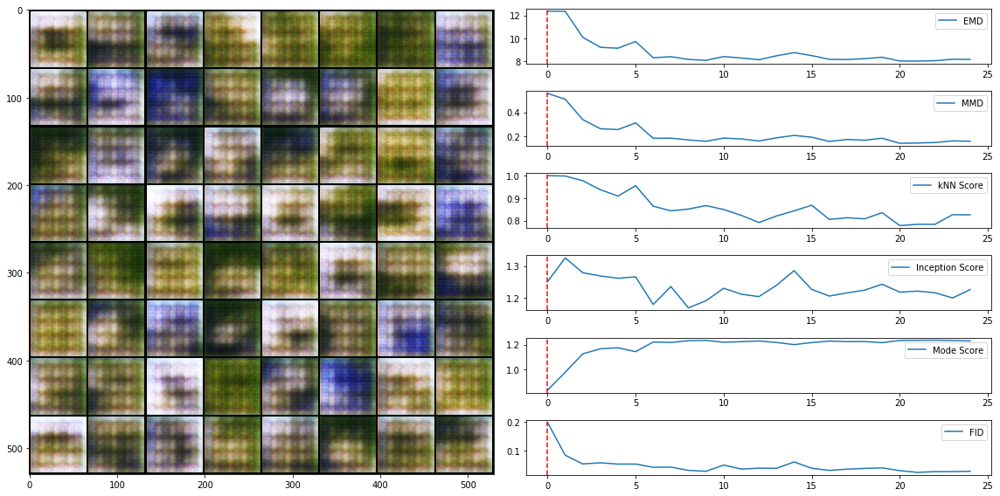

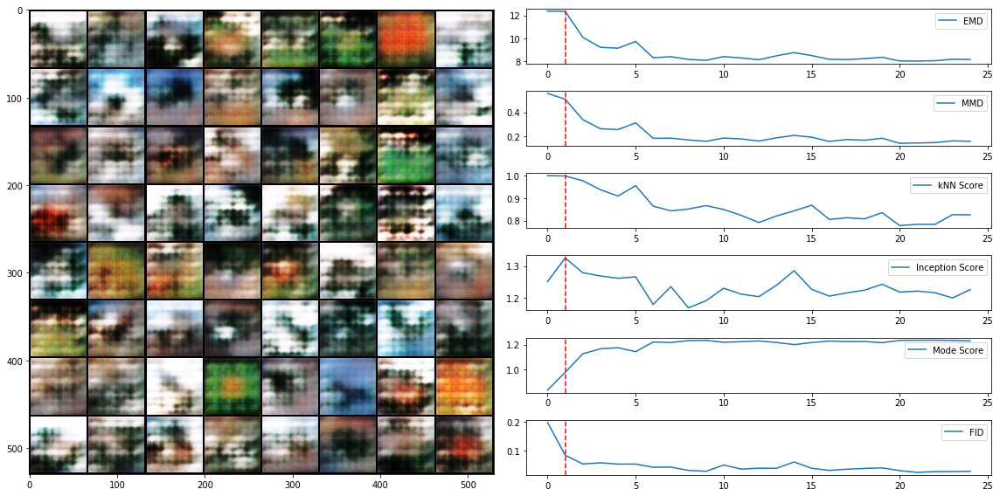

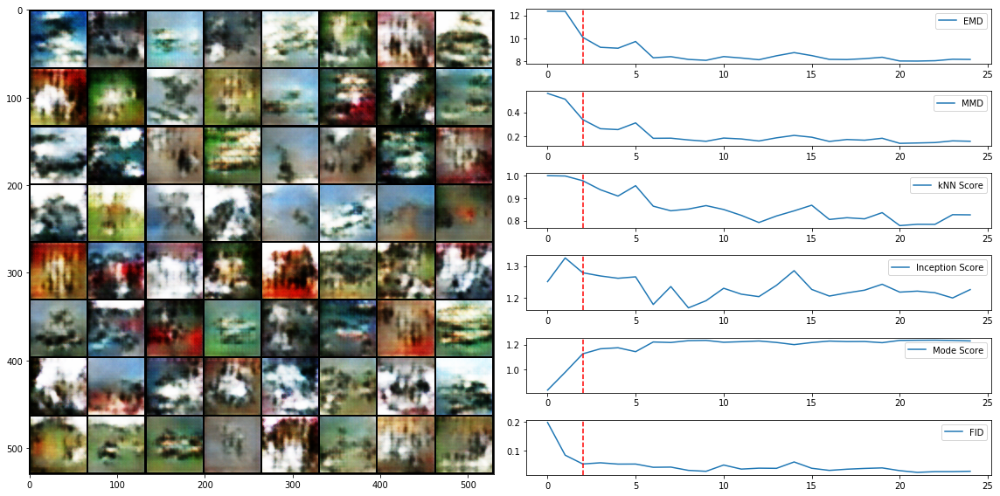

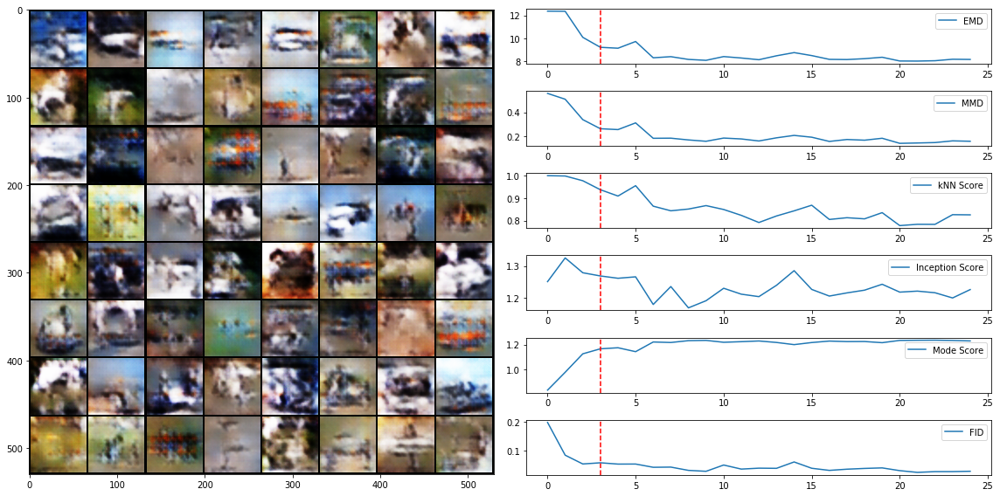

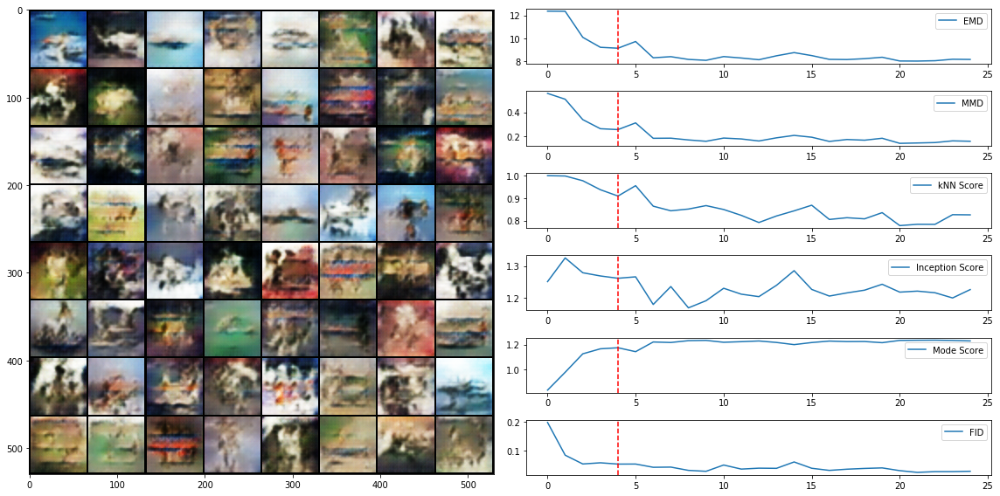

...

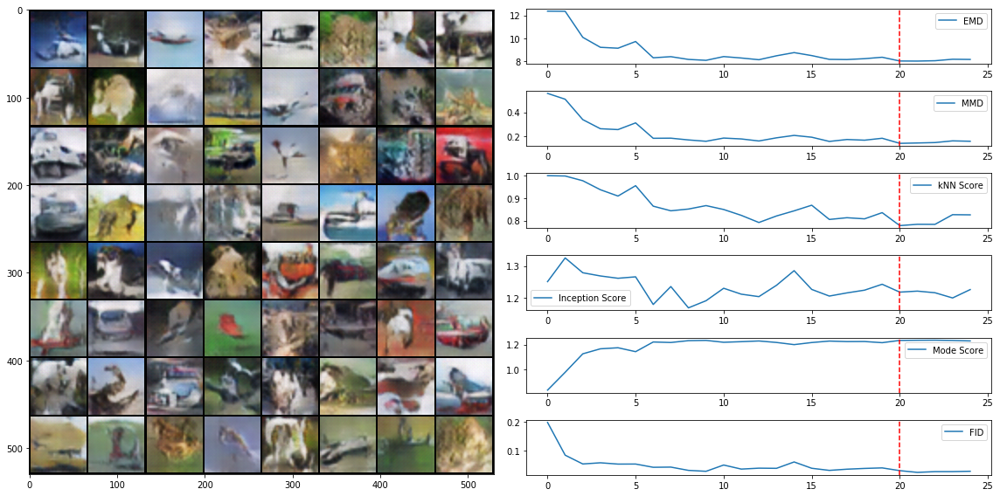

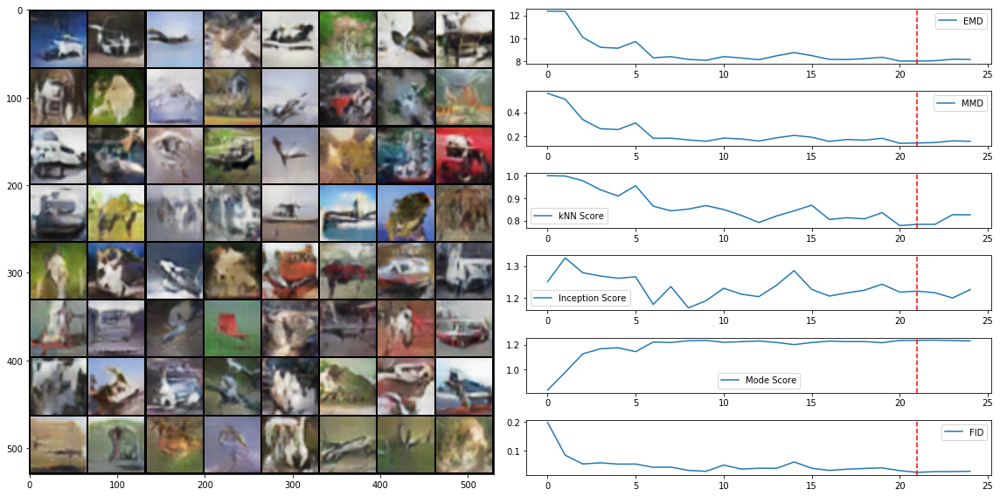

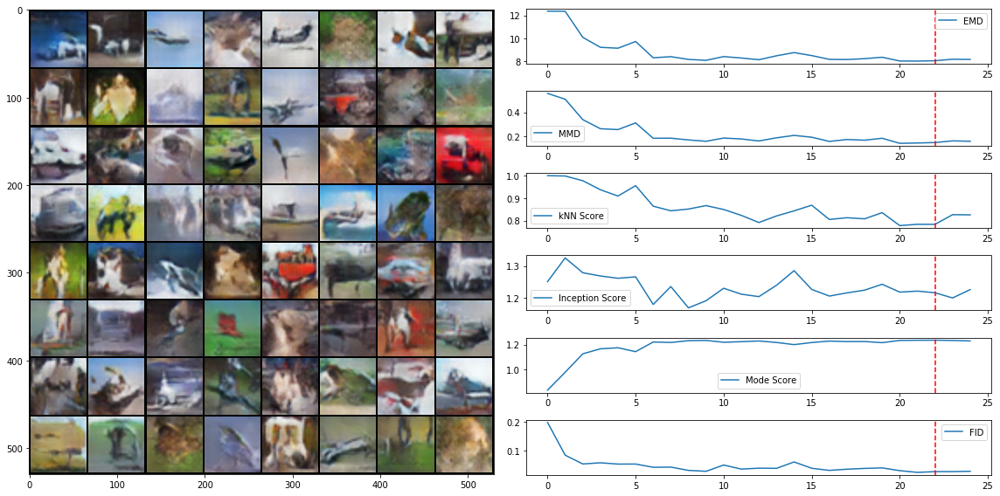

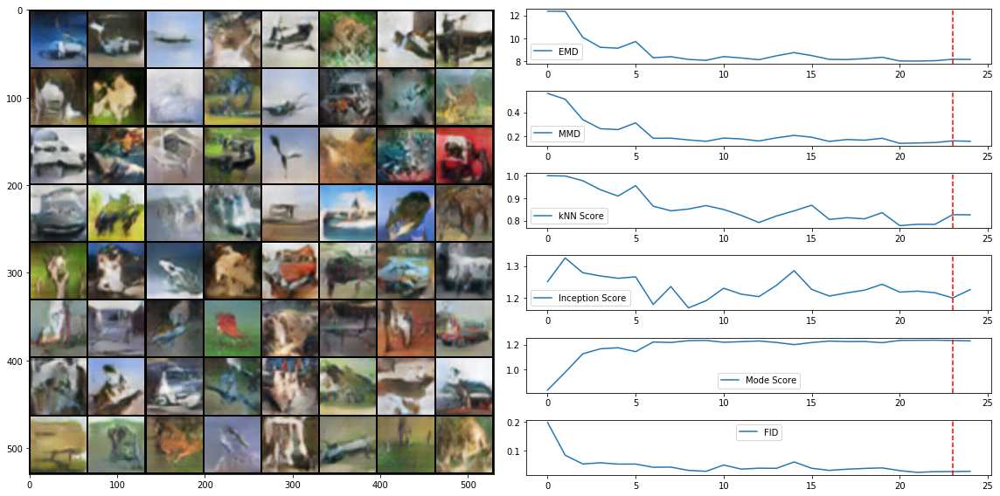

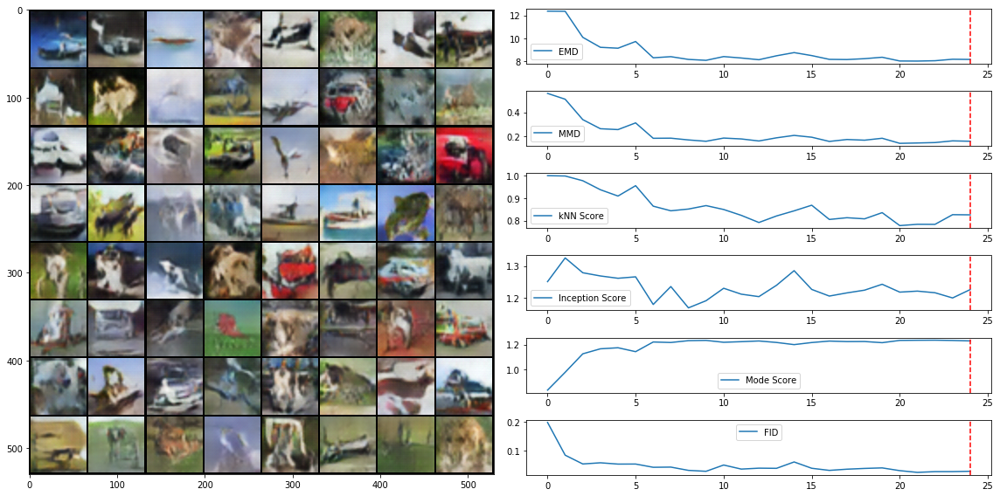

In [5]:
n_epoch = 25

x = range(n_epoch)
metric_name = ['EMD', 'MMD', 'kNN Score', 'Inception Score', 'Mode Score', 'FID']
metric_id = [7, 8, 9, 28, 29, 30]

for ep in range(n_epoch):
    print(ep)
    f = plt.figure(figsize=[16, 8])
    for i in range(6):
        ax = plt.subplot(6,2,2*i+2)
        ax.plot(x, metrics[:, metric_id[i]], label=metric_name[i])
        ax.legend()
        ax.axvline(x=ep, color='r', linestyle = '--')

    ax = plt.subplot(1,2,1)
    img = mpimg.imread(result_dir + 'fake_samples_epoch_{}.png'.format(str(ep).zfill(3)))
    ax.imshow(img)

    plt.tight_layout()
    f.savefig('demo/{}.png'.format(str(ep).zfill(3)), dpi=300, bbox_inches='tight')

In [7]:
import glob
import os

file_list = glob.glob('demo/*.png')
#list.sort(file_list, key=lambda x: int(x.split('_')[1].split('.png')[0]))

with open('image_list.txt', 'w') as file:
    for item in file_list:
        file.write("%s\n" % item)

os.system('convert @image_list.txt demo.gif')

0